# Setup

## Imports

In [1]:
import pandas as pd
import random
import pickle
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import numpy as np
from os.path import join
from tqdm.notebook import tqdm, trange
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, precision_score, recall_score, matthews_corrcoef, accuracy_score
sns.set_theme()
import matplotlib as plt
plt.rcParams['figure.figsize'] = (7, 7)
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [2]:
pd.options.mode.chained_assignment = None

## Functions

In [3]:
def find_best_prob_threshold(clf, X, y):
    f1 = []
    pred_probs = clf.predict_proba(X)[:,1]
    for prob_thre in range(1,100):      
        y_pred = (pred_probs >= prob_thre / 100).astype(bool)
        f1.append(f1_score(y, y_pred))
    max_f1 = max(f1)
    argmax_f1 = f1.index(max_f1) / 100
    return max_f1, argmax_f1

In [4]:
def test_clf_CV(clf, X, y):
    
    accuracy = []
    precision = []
    recall = []
    f1 = []
    threshold = []
    
    for month in trange(1, 12):
        
        train_X = X[X.index.str[3:5].astype(int) != month]
        test_X = X[X.index.str[3:5].astype(int) == month]
        train_y =  y[X.index.str[3:5].astype(int) != month]
        test_y =  y[X.index.str[3:5].astype(int) == month]
        print(f"Fitting leaving month {month} out...")
        clf.fit(train_X, train_y)
        
        _, thresh = find_best_prob_threshold(clf, test_X, test_y)
        threshold.append(thresh)
        print("Best threshold found is: {:.2f}".format(thresh))
        y_pred = clf.predict_proba(test_X)[:,1] > thresh
    
        accuracy.append(accuracy_score(test_y, y_pred))
        precision.append(precision_score(test_y, y_pred))
        recall.append(recall_score(test_y, y_pred))
        f1.append(f1_score(test_y, y_pred))
        
        print("Accuracy score is: {:.3f}".format(accuracy[-1]))
        print("Precision score is: {:.3f}".format(precision[-1]))
        print("Recall score is: {:.3f}".format(recall[-1]))
        print("F1 score is: {:.3f}\n".format(f1[-1]))

    score_df = pd.DataFrame({
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'threshold': threshold
    }, index=range(1,12))

    return score_df

# Main

## Load data

In [5]:
scope = 'dw'

In [6]:
DBorig = pickle.load(open(f'DB{scope}_2019.pickle', "rb"))
DBorig = DBorig[DBorig.Tech!='UVAM']
DB = DBorig.copy()
DB["date"] = pd.to_datetime(DB.index.str[:10], format="%d/%m/%Y")
DB.sort_values("date", inplace=True)
DB.drop(["date", "Target"], axis=1, inplace=True)
DB['PU'] = DB.index.str.extract(r'\d{2}/\d{2}/\d{4}\d{1,2}(U.*)', expand=False)
DB['Result'].value_counts() # check su % accettati su totale

Result
0.0    431219
1       70275
Name: count, dtype: int64

In [7]:
# We first of all create a test "hold-out" dataset corresponding to the last month, that we don't consider until the very end evaluation
test_DB = DB[DB.index.str[3:5] == '12']
DB = DB[DB.index.str[3:5] != '12']
DB.head()

,hour,SC_PC1,SC_PC2,IN_PC1,IN_PC2,CT_PC1,CT_PC2,PurchMGP,SellMGP,MargTech,GNprice,SolarAngle,DeclAngle,WorkDay,Prov,Tech,PV,Price,Result,PU
idx,,,,,,,,,,,,,,,,,,,,
01/01/20191UP_BARGI_CEN_1,1,3.353367,0.050663,-3.76401,0.464396,-1.042284,2.704958,11460.324,9179.693,Ccgt,23.11,-178.226106,-23.011637,holiday,Bologna,Hydro Pumped Storage,0.0,0.0,0.0,UP_BARGI_CEN_1
01/01/201918UP_RIVADEL_3,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,23.11,76.773894,-23.011637,holiday,Trento,Hydro Pumped Storage,0.0,13.0,0.0,UP_RIVADEL_3
01/01/201918UP_RONCOVALG_1,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,23.11,76.773894,-23.011637,holiday,Varese,Hydro Pumped Storage,1.0,0.0,0.0,UP_RONCOVALG_1
01/01/201918UP_ROVESCA_1,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,23.11,76.773894,-23.011637,holiday,Verbano-Cusio-Ossola,Hydro Pumped Storage,0.421567,0.0,0.0,UP_ROVESCA_1
01/01/201918UP_S.FIORANO_1,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,23.11,76.773894,-23.011637,holiday,Lodi,Hydro Pumped Storage,0.1963,0.0,0.0,UP_S.FIORANO_1


## Models

### Historical marginal price

The idea is to compute the empirical distribution of the hourly maximum awarded price (= marginal price), distinguishing between working days and holidays and then predict a bid as accepted if its price falls above a randomly picked price for the marginal prices distribution

#### Compute distributions of marginal price for working day and holidays

In [8]:
DB['Timestamp'] = DB.index.str.extract(r'(\d{2}/\d{2}/\d{4}\d{1,2})U.*', expand=False)
DB.head(3)

,hour,SC_PC1,SC_PC2,IN_PC1,IN_PC2,CT_PC1,CT_PC2,PurchMGP,SellMGP,MargTech,...,SolarAngle,DeclAngle,WorkDay,Prov,Tech,PV,Price,Result,PU,Timestamp
idx,,,,,,,,,,,,,,,,,,,,,
01/01/20191UP_BARGI_CEN_1,1,3.353367,0.050663,-3.76401,0.464396,-1.042284,2.704958,11460.324,9179.693,Ccgt,...,-178.226106,-23.011637,holiday,Bologna,Hydro Pumped Storage,0.0,0.0,0.0,UP_BARGI_CEN_1,01/01/20191
01/01/201918UP_RIVADEL_3,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,...,76.773894,-23.011637,holiday,Trento,Hydro Pumped Storage,0.0,13.0,0.0,UP_RIVADEL_3,01/01/201918
01/01/201918UP_RONCOVALG_1,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,...,76.773894,-23.011637,holiday,Varese,Hydro Pumped Storage,1.0,0.0,0.0,UP_RONCOVALG_1,01/01/201918


In [132]:
price_agg = DB[DB.Result == 1].groupby(['WorkDay', 'Timestamp'])['Price']
if scope == 'dw':
    marginal_prices = price_agg.min()
else:
    marginal_prices = price_agg.max()
marginal_prices.head(3)

WorkDay  Timestamp   
holiday  01/01/20191     9.308964
         01/01/201910         0.0
         01/01/201911         8.0
Name: Price, dtype: object

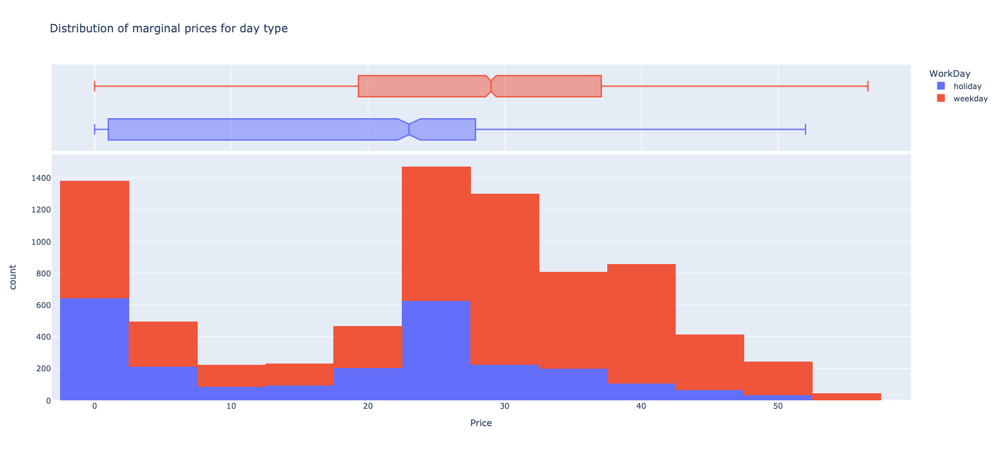

In [133]:
fig = px.histogram(marginal_prices.reset_index(), x='Price', color='WorkDay', title='Distribution of marginal prices for day type', nbins=20, marginal='box')
fig.update_layout(width=700, height=700)

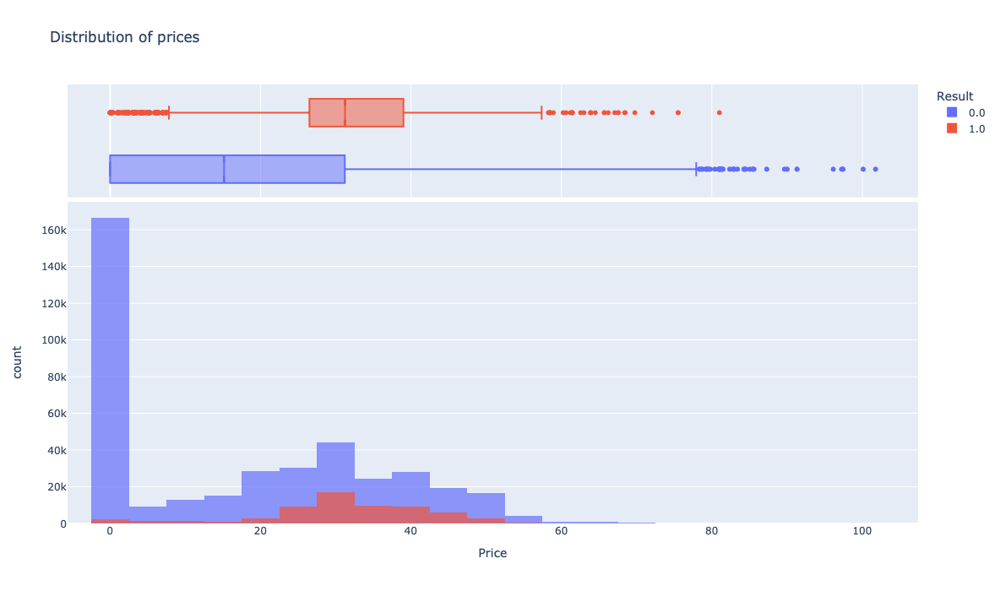

In [134]:
# Create figure using plotly express
fig = px.histogram(DB, x='Price', color='Result', title='Distribution of prices', nbins=50, barmode='overlay', opacity=0.7, marginal='box')
fig.update_layout(width=1000, height=700)

#### Acceptance rule

In [135]:
def predict_historical(price, workday):
    marg_price = random.choice(marginal_prices[workday,:])
    if price > marg_price: # If the price is above the marginal price
        return 1 # We accept it
    else:
        return 0 # Otherwise we reject it

#### Predict on the hold-out set

In [145]:
y_test = test_DB.Result.astype(int)
y_pred_hist = test_DB.apply(lambda row: predict_historical(row['Price'], row['WorkDay']), axis=1)

/usr/local/Cellar/python@3.11/3.11.3/Frameworks/Python.framework/Versions/3.11/lib/python3.11/random.py:374: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [146]:
print(classification_report(y_test, y_pred_hist))

              precision    recall  f1-score   support

           0       0.88      0.73      0.80     29589
           1       0.31      0.54      0.40      6688

    accuracy                           0.70     36277
   macro avg       0.59      0.64      0.60     36277
weighted avg       0.77      0.70      0.72     36277



In [147]:
print(confusion_matrix(y_test, y_pred_hist))

[[21667  7922]
 [ 3083  3605]]


### Logistic Regression

In [294]:
categorical_features = ['MargTech', 'hour', 'WorkDay', 'Prov', 'Tech', 'PU']
numeric_features = ["PurchMGP", "SellMGP", "GNprice", "SolarAngle", "DeclAngle", "PV", "Price"]

feature_trans = make_column_transformer(
    (OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_features),
    (StandardScaler(), numeric_features),
    remainder = "passthrough"
)

In [ ]:
clf = LogisticRegressionCV(
    n_jobs = -1,
    max_iter = 3000,
    scoring = make_scorer(f1_score),
    solver = 'saga',
)

X = feature_trans.fit_transform(DB.drop(['Result', 'Timestamp'], axis=1))
y = DB.Result.astype(int)

clf.fit(X, y)

In [265]:
scores = pd.DataFrame(clf.scores_[1].T, columns=[f'fold_{k}' for k in range(5)])
scores['CV_score'] = scores[[f'fold_{k}' for k in range(5)]].mean(axis=1)
scores['C_values'] = clf.Cs_
scores

,fold_0,fold_1,fold_2,fold_3,fold_4,CV_score,C_values
0,0.313336,0.164556,0.000785,0.110598,0.184957,0.154846,0.000100
1,0.586485,0.564849,0.129120,0.540434,0.481207,0.460419,0.000774
2,0.635627,0.623887,0.222028,0.574277,0.534796,0.518123,0.005995
3,0.634933,0.638887,0.242599,0.581983,0.531518,0.525984,0.046416
4,0.635016,0.638528,0.248049,0.567278,0.520388,0.521852,0.359381
5,0.637222,0.618557,0.257165,0.534569,0.497496,0.509002,2.782559
6,0.637151,0.604749,0.259374,0.516124,0.479280,0.499335,21.544347
7,0.637193,0.600955,0.259934,0.513510,0.474246,0.497168,166.810054
8,0.637312,0.600046,0.260030,0.513040,0.473399,0.496765,1291.549665
9,0.637374,0.600038,0.260030,0.512957,0.473286,0.496737,10000.000000


In [266]:
# Optimal classification probability threshold based on OOB
idx = 0

start = 1
end = 99
step = 1

precision = []
recall = []
mcc = []
accuracy = []
f1 = []
threshold = []

pred_probs = clf.predict_proba(X)[:,1]

for prob_thre in trange(start, end, step):
    
    y_pred = (pred_probs >= prob_thre / 100).astype(bool)

    precision.append(precision_score(y, y_pred))
    recall.append(recall_score(y, y_pred))
    mcc.append(matthews_corrcoef(y, y_pred))
    accuracy.append(accuracy_score(y, y_pred))
    f1.append(f1_score(y, y_pred))
    
    threshold.append(prob_thre / 100)

  0%|          | 0/98 [00:00<?, ?it/s]

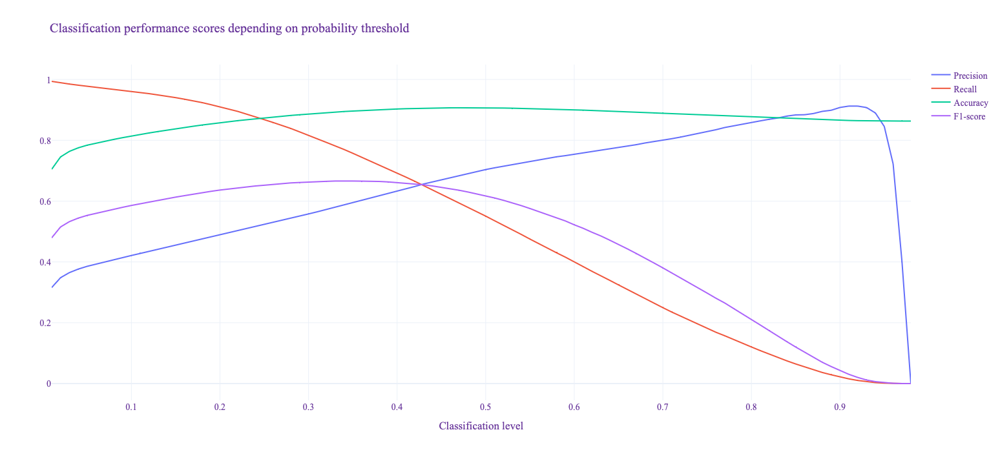

In [267]:
# Plot graph
fig = go.Figure()
fig.add_trace(go.Scatter(x=threshold, y=precision, name="Precision"))
fig.add_trace(go.Scatter(x=threshold, y=recall, name="Recall"))
fig.add_trace(go.Scatter(x=threshold, y=accuracy, name="Accuracy"))
fig.add_trace(go.Scatter(x=threshold, y=f1, name="F1-score"))
fig.update_layout(title="Classification performance scores depending on probability threshold",
                  xaxis_title="Classification level",
                  font=dict(family="Times New Roman, monospace", size=14, color="RebeccaPurple"),
                  template="plotly_white", width=1000, height=700)
fig.show()

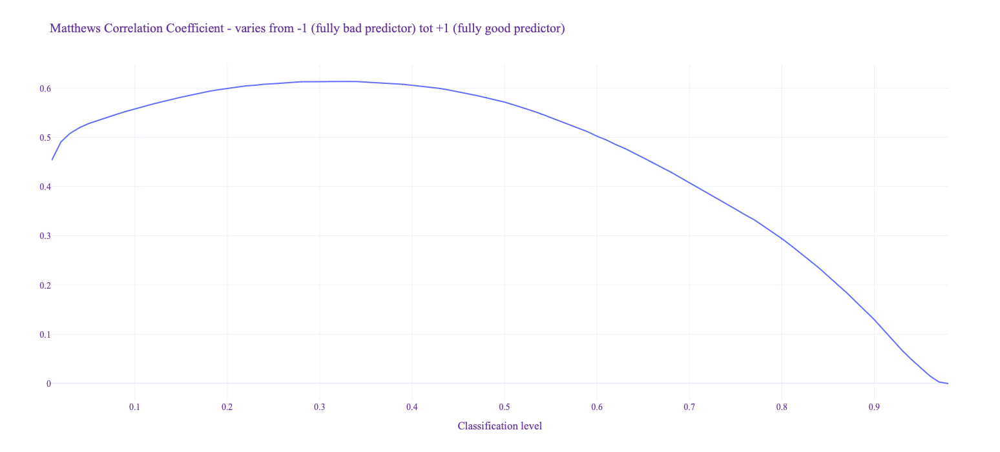

In [268]:
# Matthews Correlation Coefficient varying the threshold
fig = go.Figure()
fig.add_trace(go.Scatter(x=threshold, y=mcc))
fig.update_layout(title="Matthews Correlation Coefficient - varies from -1 (fully bad predictor) tot +1 (fully good predictor)",
                  xaxis_title="Classification level",
                  font=dict(family="Times New Roman, monospace",size=14,color="RebeccaPurple"),
                  template="plotly_white", width=1000, height=700)
fig.show()

In [316]:
clf = LogisticRegression(
    n_jobs = -1,
    C = 0.1,
    max_iter = 3000,
    solver = 'saga',
)

clf = make_pipeline(feature_trans, clf)
small_DB = DB.sample(10_000)

X = DB.drop(['Result', 'Timestamp'], axis=1)
y = DB.Result.astype(int)

score_df = test_clf_CV(clf, X, y)

  0%|          | 0/11 [00:00<?, ?it/s]

Fitting leaving month 1 out...
Best threshold found is: 0.39
Accuracy score is: 0.928
Precision score is: 0.554
Recall score is: 0.679
F1 score is: 0.610

Fitting leaving month 2 out...
Best threshold found is: 0.39
Accuracy score is: 0.898
Precision score is: 0.566
Recall score is: 0.689
F1 score is: 0.621

Fitting leaving month 3 out...
Best threshold found is: 0.44
Accuracy score is: 0.898
Precision score is: 0.630
Recall score is: 0.814
F1 score is: 0.710

Fitting leaving month 4 out...
Best threshold found is: 0.31
Accuracy score is: 0.890
Precision score is: 0.588
Recall score is: 0.825
F1 score is: 0.687

Fitting leaving month 5 out...
Best threshold found is: 0.42
Accuracy score is: 0.923
Precision score is: 0.661
Recall score is: 0.808
F1 score is: 0.727

Fitting leaving month 6 out...
Best threshold found is: 0.07
Accuracy score is: 0.874
Precision score is: 0.470
Recall score is: 0.848
F1 score is: 0.605

Fitting leaving month 7 out...
Best threshold found is: 0.26
Accuracy 

In [317]:
score_df.mean()

accuracy     0.887012
precision    0.567340
recall       0.789709
f1           0.657608
threshold    0.322727
dtype: float64

<Axes: >

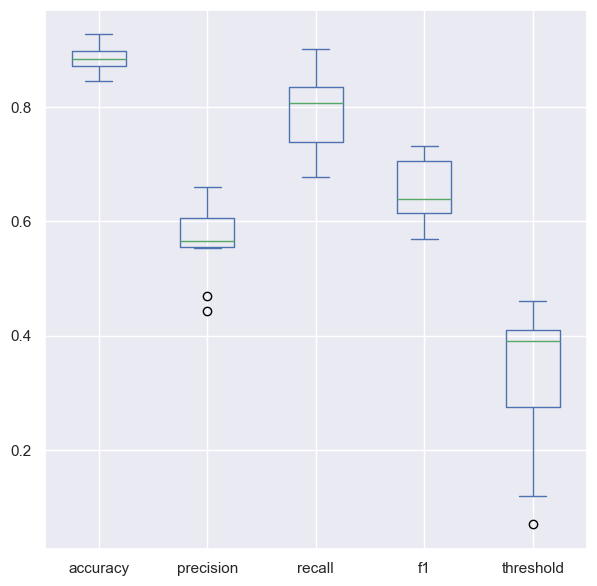

In [328]:
score_df.plot(kind='box')

In [229]:
threshold = 0.3

X_test = feature_trans.fit_transform(test_DB.drop(['Result'], axis=1))
y_pred_logit = clf.predict_proba(X_test)[:,1] > threshold

print(classification_report(y_test, y_pred_logit))
print(confusion_matrix(y_test, y_pred_logit))

              precision    recall  f1-score   support

           0       0.94      0.93      0.94     29589
           1       0.70      0.76      0.73      6688

    accuracy                           0.90     36277
   macro avg       0.82      0.84      0.83     36277
weighted avg       0.90      0.90      0.90     36277

[[27462  2127]
 [ 1611  5077]]


Good performance on the test ! Now we need to check with daily recal

### Linear Mixed Effect Model with reduced database

In [333]:
DB['PU'] = DB.index.str.extract(r'\d{2}/\d{2}/\d{4}\d{1,2}(U.*)', expand=False)
DB['PU'].nunique()

130

In [242]:
reduced_DB = DB[['PU', 'PV', 'Price', 'Result']]
reduced_DB

,PU,PV,Price,Result
idx,,,,
01/01/20191UP_BARGI_CEN_1,UP_BARGI_CEN_1,0.0,0.0,0.0
01/01/201918UP_RIVADEL_3,UP_RIVADEL_3,0.0,13.0,0.0
01/01/201918UP_RONCOVALG_1,UP_RONCOVALG_1,1.0,0.0,0.0
01/01/201918UP_ROVESCA_1,UP_ROVESCA_1,0.421567,0.0,0.0
01/01/201918UP_S.FIORANO_1,UP_S.FIORANO_1,0.1963,0.0,0.0
...,...,...,...,...
30/11/201910UP_ETQCHIOTAS_1,UP_ETQCHIOTAS_1,0.0,46.56,0.0
30/11/201910UP_EDOLO_1,UP_EDOLO_1,0.165851,0.0,0.0
30/11/201910UP_CURON_ME_1,UP_CURON_ME_1,0.583333,0.0,0.0


Export to R

In [243]:
pwd

'/Users/guillaume/Documents/GitHub/prometheus/downward'

In [247]:
reduced_DB.to_csv('reduced_train_db.csv')

In [334]:
DB.to_csv(f'train_db_{scope}.csv')

<Axes: xlabel='hour'>

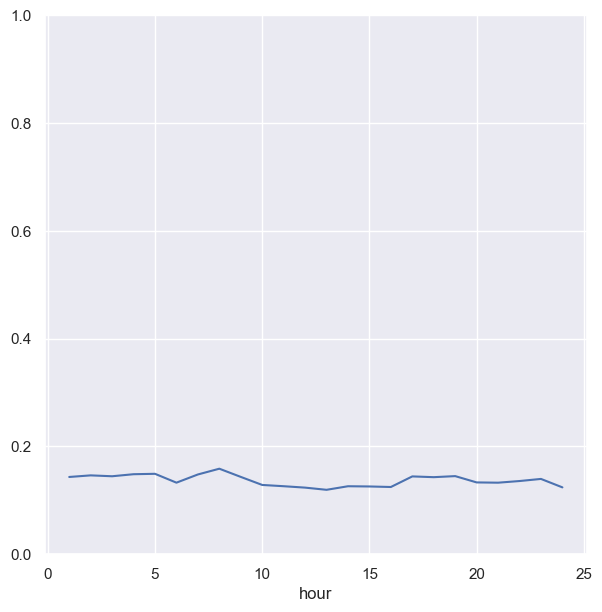

In [251]:
DB.groupby('hour')['Result'].mean().plot(ylim=(0,1))

<Axes: xlabel='MargTech'>

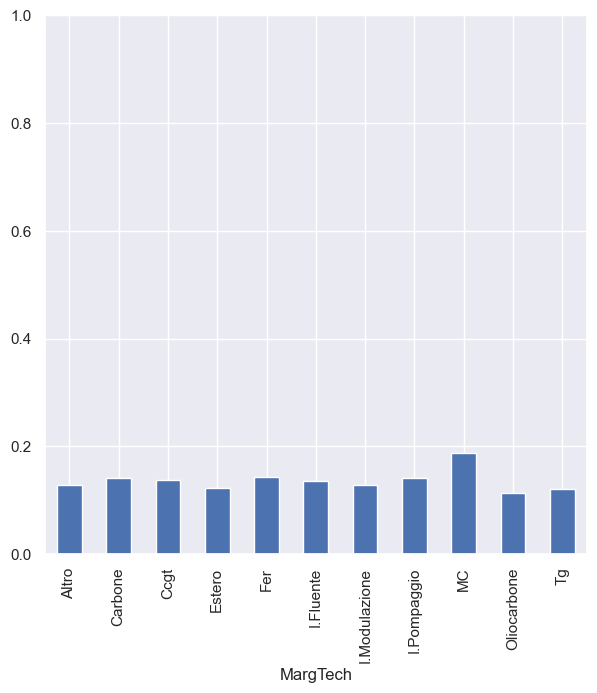

In [258]:
DB.groupby('MargTech')['Result'].mean().plot(kind='bar', ylim=(0,1))

In [255]:
DB

,hour,SC_PC1,SC_PC2,IN_PC1,IN_PC2,CT_PC1,CT_PC2,PurchMGP,SellMGP,MargTech,...,SolarAngle,DeclAngle,WorkDay,Prov,Tech,PV,Price,Result,Timestamp,PU
idx,,,,,,,,,,,,,,,,,,,,,
01/01/20191UP_BARGI_CEN_1,1,3.353367,0.050663,-3.76401,0.464396,-1.042284,2.704958,11460.324,9179.693,Ccgt,...,-178.226106,-23.011637,holiday,Bologna,Hydro Pumped Storage,0.0,0.0,0.0,01/01/20191,UP_BARGI_CEN_1
01/01/201918UP_RIVADEL_3,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,...,76.773894,-23.011637,holiday,Trento,Hydro Pumped Storage,0.0,13.0,0.0,01/01/201918,UP_RIVADEL_3
01/01/201918UP_RONCOVALG_1,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,...,76.773894,-23.011637,holiday,Varese,Hydro Pumped Storage,1.0,0.0,0.0,01/01/201918,UP_RONCOVALG_1
01/01/201918UP_ROVESCA_1,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,...,76.773894,-23.011637,holiday,Verbano-Cusio-Ossola,Hydro Pumped Storage,0.421567,0.0,0.0,01/01/201918,UP_ROVESCA_1
01/01/201918UP_S.FIORANO_1,18,0.155675,2.293847,-1.741667,0.780216,-1.36499,2.341325,14666.724,11233.886,Ccgt,...,76.773894,-23.011637,holiday,Lodi,Hydro Pumped Storage,0.1963,0.0,0.0,01/01/201918,UP_S.FIORANO_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30/11/201910UP_ETQCHIOTAS_1,10,0.619961,0.319571,0.087942,-0.109236,0.095263,-0.865934,19038.53,15122.495,Carbone,...,-39.714944,-21.969868,holiday,Cuneo,Hydro Pumped Storage,0.0,46.56,0.0,30/11/201910,UP_ETQCHIOTAS_1
30/11/201910UP_EDOLO_1,10,0.619961,0.319571,0.087942,-0.109236,0.095263,-0.865934,19038.53,15122.495,Carbone,...,-39.714944,-21.969868,holiday,Brescia,Hydro Pumped Storage,0.165851,0.0,0.0,30/11/201910,UP_EDOLO_1
30/11/201910UP_CURON_ME_1,10,0.619961,0.319571,0.087942,-0.109236,0.095263,-0.865934,19038.53,15122.495,Carbone,...,-39.714944,-21.969868,holiday,Bolzano,Hydro Run-of-river and poundage,0.583333,0.0,0.0,30/11/201910,UP_CURON_ME_1
